<a href="https://colab.research.google.com/github/BioTerran/asset-vae/blob/master/AssetTesting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!pip install --upgrade tensorflow

Requirement already up-to-date: tensorflow in /usr/local/lib/python3.6/dist-packages (2.1.0)


In [0]:
import numpy as np
import tensorflow as tf

tf.version

<module 'tensorflow_core._api.v2.version' from '/usr/local/lib/python3.6/dist-packages/tensorflow_core/_api/v2/version/__init__.py'>

In [0]:
tf.executing_eagerly()

True

In [0]:
!unzip items.zip

Archive:  items.zip
  inflating: tile000.png             
  inflating: tile001.png             
  inflating: tile002.png             
  inflating: tile003.png             
  inflating: tile004.png             
  inflating: tile005.png             
  inflating: tile006.png             
  inflating: tile007.png             
  inflating: tile008.png             
  inflating: tile009.png             
  inflating: tile010.png             
  inflating: tile011.png             
  inflating: tile012.png             
  inflating: tile013.png             
  inflating: tile014.png             
  inflating: tile015.png             
  inflating: tile016.png             
  inflating: tile017.png             
  inflating: tile018.png             
  inflating: tile019.png             
  inflating: tile020.png             
  inflating: tile021.png             
  inflating: tile022.png             
  inflating: tile023.png             
  inflating: tile024.png             
  inflating: tile025.png      

In [0]:
item_paths = tf.data.Dataset.list_files('./*.png')

for f in item_paths.take(5):
  print(f.numpy())

b'./tile237.png'
b'./tile010.png'
b'./tile052.png'
b'./tile142.png'
b'./tile001.png'


In [0]:
import matplotlib.pyplot as plt

def decode_img(img):
  # convert the compressed string to a 2D uint8 tensor
  img = tf.image.decode_jpeg(img, channels=3)
  # Use `convert_image_dtype` to convert to floats in the [0,1] range.
  img = tf.image.convert_image_dtype(img, tf.float32)
  # resize the image to the desired size.
  return tf.image.resize(img, [48, 48])

def process_path(file_path):
  # label = get_label(file_path)
  # load the raw data from the file as a string
  img = tf.io.read_file(file_path)
  img = decode_img(img)
  return img

def prepare_for_training(ds, cache=True, shuffle_buffer_size=32):
  # This is a small dataset, only load it once, and keep it in memory.
  # use `.cache(filename)` to cache preprocessing work for datasets that don't
  # fit in memory.
  if cache:
    if isinstance(cache, str):
      ds = ds.cache(cache)
    else:
      ds = ds.cache()

  ds = ds.shuffle(buffer_size=shuffle_buffer_size)

  # Repeat forever
  ds = ds.repeat()

  ds = ds.batch(128)

  # `prefetch` lets the dataset fetch batches in the background while the model
  # is training.
  ds = ds.prefetch(buffer_size=8)

  return ds

def show_batch(image_batch):
  plt.figure(figsize=(10,10))
  for n in range(25):
      ax = plt.subplot(5,5,n+1)
      plt.imshow(image_batch[n])
      plt.axis('off')

Image shape:  (48, 48, 3)


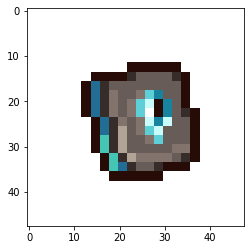

Image shape:  (48, 48, 3)


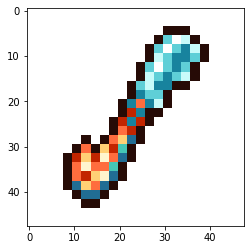

Image shape:  (48, 48, 3)


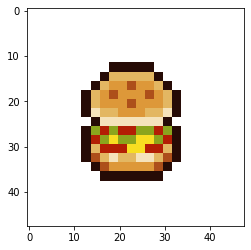

In [0]:
items = item_paths.map(process_path, num_parallel_calls=2)

for image in items.take(3):
  print("Image shape: ", image.numpy().shape)
  plt.imshow(image.numpy().squeeze(), cmap='gray')
  plt.show()

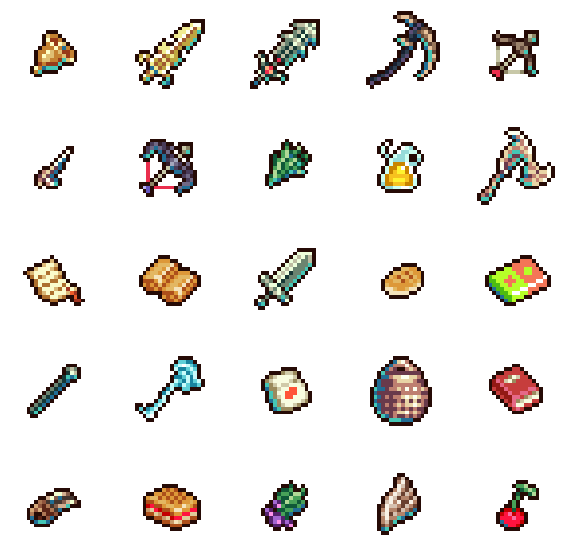

In [0]:
train_ds = prepare_for_training(items)
image_batch = next(iter(train_ds))

show_batch(image_batch.numpy())

In [0]:
class CVAE(tf.keras.Model):
  def __init__(self, latent_dim):
    super(CVAE, self).__init__()
    self.latent_dim = latent_dim
    self.inference_net = tf.keras.Sequential(
      [
          tf.keras.layers.InputLayer(input_shape=(48, 48, 3)),
          tf.keras.layers.Conv2D(
              filters=48, kernel_size=3, strides=(3, 3), activation='relu'),
          tf.keras.layers.Conv2D(
              filters=96, kernel_size=3, strides=(3, 3), activation='relu'),
          tf.keras.layers.Flatten(),
          # No activation
          tf.keras.layers.Dense(latent_dim + latent_dim),
      ]
    )

    self.generative_net = tf.keras.Sequential(
        [
          tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
          tf.keras.layers.Dense(units=12*12*32, activation=tf.nn.relu),
          tf.keras.layers.Reshape(target_shape=(12, 12, 32)),
          tf.keras.layers.Conv2DTranspose(
              filters=96,
              kernel_size=3,
              strides=(2, 2),
              padding="SAME",
              activation='relu'),
          tf.keras.layers.Conv2DTranspose(
              filters=48,
              kernel_size=3,
              strides=(2, 2),
              padding="SAME",
              activation='relu'),
          # No activation
          tf.keras.layers.Conv2DTranspose(
              filters=3, kernel_size=3, strides=(1, 1), padding="SAME"),
        ]
    )

  @tf.function
  def sample(self, eps=None):
    if eps is None:
      eps = tf.random.normal(shape=(100, self.latent_dim))
    return self.decode(eps, apply_sigmoid=True)

  def encode(self, x):
    mean, logvar = tf.split(self.inference_net(x), num_or_size_splits=2, axis=1)
    return mean, logvar

  def reparameterize(self, mean, logvar):
    eps = tf.random.normal(shape=mean.shape)
    return eps * tf.exp(logvar * .5) + mean

  def decode(self, z, apply_sigmoid=False):
    logits = self.generative_net(z)
    if apply_sigmoid:
      probs = tf.sigmoid(logits)
      return probs

    return logits

In [0]:
optimizer = tf.keras.optimizers.Adam(1e-4)

def log_normal_pdf(sample, mean, logvar, raxis=1):
  log2pi = tf.math.log(2. * np.pi)
  return tf.reduce_sum(
      -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
      axis=raxis)

@tf.function
def compute_loss(model, x):
  mean, logvar = model.encode(x)
  z = model.reparameterize(mean, logvar)
  x_logit = model.decode(z)

  cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
  logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2, 3])
  logpz = log_normal_pdf(z, 0., 0.)
  logqz_x = log_normal_pdf(z, mean, logvar)
  return -tf.reduce_mean(logpx_z + logpz - logqz_x)

@tf.function
def compute_apply_gradients(model, x, optimizer):
  with tf.GradientTape() as tape:
    loss = compute_loss(model, x)
  gradients = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))

In [0]:
epochs = 200
latent_dim = 50
num_examples_to_generate = 16

# keeping the random vector constant for generation (prediction) so
# it will be easier to see the improvement.
random_vector_for_generation = tf.random.normal(
    shape=[num_examples_to_generate, latent_dim])
model = CVAE(latent_dim)

In [0]:
def generate_and_save_images(model, epoch, test_input):
  predictions = model.sample(test_input)
  fig = plt.figure(figsize=(4,4))

  for i in range(predictions.shape[0]):
      plt.subplot(4, 4, i+1)
      plt.imshow(predictions[i])
      plt.axis('off')

  # tight_layout minimizes the overlap between 2 sub-plots
  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

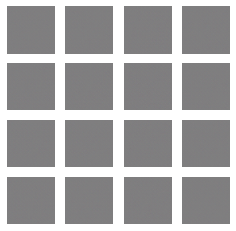

Epoch: 1, Test set ELBO: -1833.004638671875, time elapse for current epoch 4.452077150344849


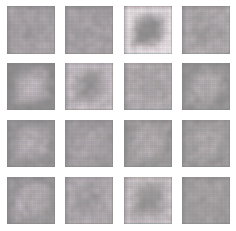

Epoch: 2, Test set ELBO: -1704.797119140625, time elapse for current epoch 3.7191784381866455


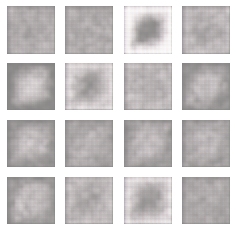

Epoch: 3, Test set ELBO: -1548.737060546875, time elapse for current epoch 3.7265193462371826


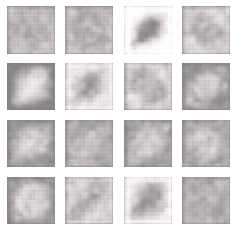

Epoch: 4, Test set ELBO: -1471.2236328125, time elapse for current epoch 3.7263102531433105


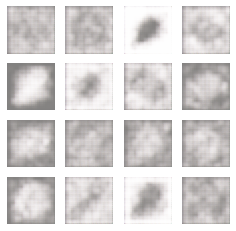

Epoch: 5, Test set ELBO: -1390.1951904296875, time elapse for current epoch 3.7179372310638428


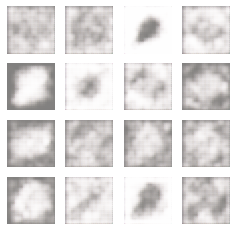

Epoch: 6, Test set ELBO: -1335.8717041015625, time elapse for current epoch 3.723592519760132


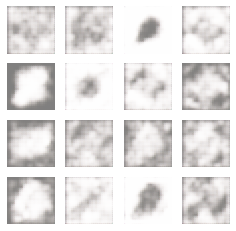

Epoch: 7, Test set ELBO: -1295.394287109375, time elapse for current epoch 3.72772479057312


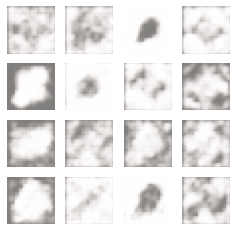

Epoch: 8, Test set ELBO: -1259.5523681640625, time elapse for current epoch 3.7320094108581543


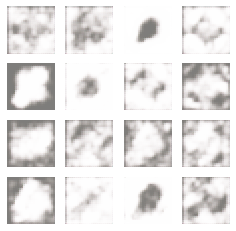

Epoch: 9, Test set ELBO: -1216.591064453125, time elapse for current epoch 3.730370283126831


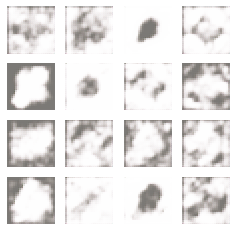

Epoch: 10, Test set ELBO: -1159.1619873046875, time elapse for current epoch 3.727154016494751


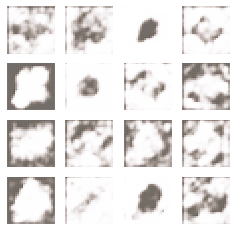

Epoch: 11, Test set ELBO: -1102.709228515625, time elapse for current epoch 3.720592737197876


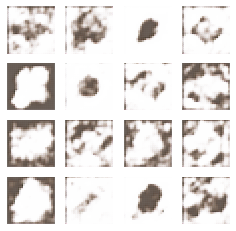

Epoch: 12, Test set ELBO: -1058.94677734375, time elapse for current epoch 3.7259178161621094


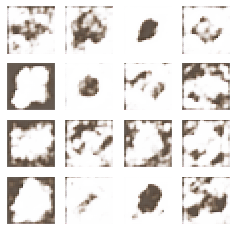

Epoch: 13, Test set ELBO: -1024.11083984375, time elapse for current epoch 3.7286455631256104


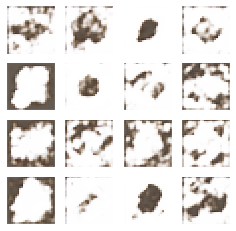

Epoch: 14, Test set ELBO: -993.0888061523438, time elapse for current epoch 3.7287352085113525


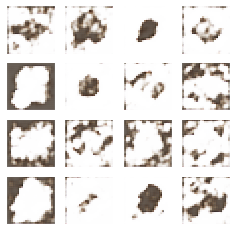

Epoch: 15, Test set ELBO: -968.6688232421875, time elapse for current epoch 3.727652072906494


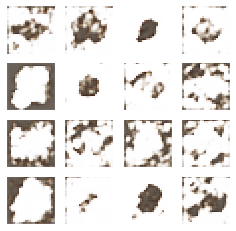

Epoch: 16, Test set ELBO: -946.0217895507812, time elapse for current epoch 3.7273151874542236


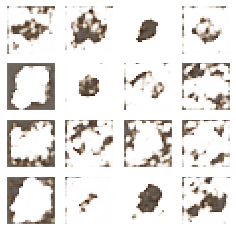

Epoch: 17, Test set ELBO: -928.091552734375, time elapse for current epoch 3.7231879234313965


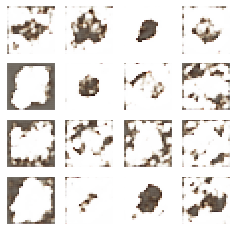

Epoch: 18, Test set ELBO: -910.7042846679688, time elapse for current epoch 3.732825756072998


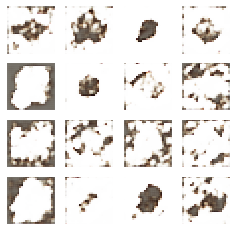

Epoch: 19, Test set ELBO: -897.2900390625, time elapse for current epoch 3.731834650039673


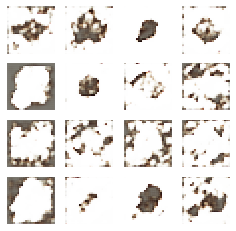

Epoch: 20, Test set ELBO: -884.6272583007812, time elapse for current epoch 3.731097459793091


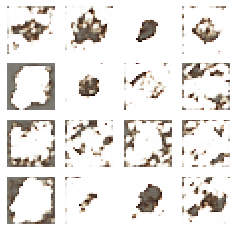

Epoch: 21, Test set ELBO: -874.276611328125, time elapse for current epoch 3.7296957969665527


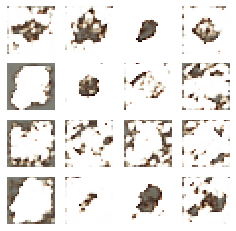

Epoch: 22, Test set ELBO: -863.6460571289062, time elapse for current epoch 3.7334017753601074


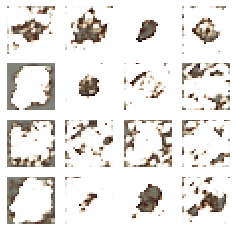

Epoch: 23, Test set ELBO: -857.0001220703125, time elapse for current epoch 3.7266757488250732


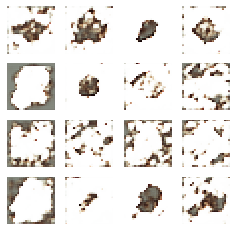

Epoch: 24, Test set ELBO: -848.152587890625, time elapse for current epoch 3.7299749851226807


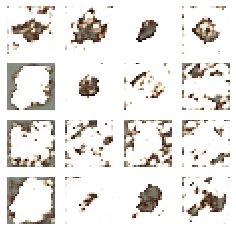

Epoch: 25, Test set ELBO: -842.1043701171875, time elapse for current epoch 3.7266945838928223


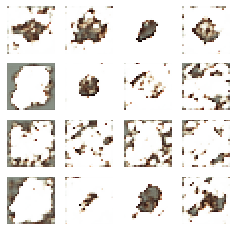

Epoch: 26, Test set ELBO: -835.0660400390625, time elapse for current epoch 3.727754831314087


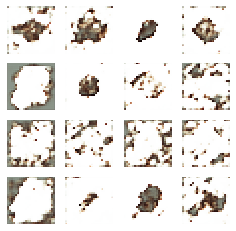

Epoch: 27, Test set ELBO: -828.8994140625, time elapse for current epoch 3.727726936340332


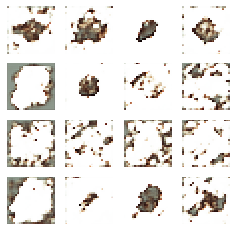

Epoch: 28, Test set ELBO: -822.98388671875, time elapse for current epoch 3.7356183528900146


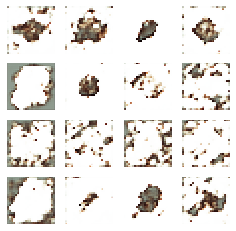

Epoch: 29, Test set ELBO: -817.360107421875, time elapse for current epoch 3.7284841537475586


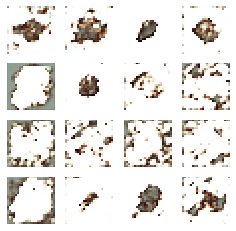

Epoch: 30, Test set ELBO: -812.760009765625, time elapse for current epoch 3.7311899662017822


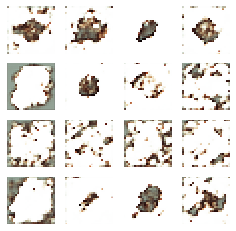

Epoch: 31, Test set ELBO: -809.0419921875, time elapse for current epoch 3.7270827293395996


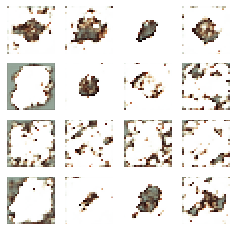

Epoch: 32, Test set ELBO: -802.3815307617188, time elapse for current epoch 3.7265002727508545


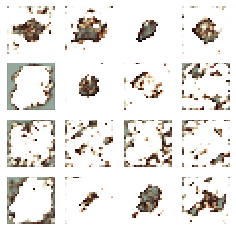

Epoch: 33, Test set ELBO: -799.704833984375, time elapse for current epoch 3.726783275604248


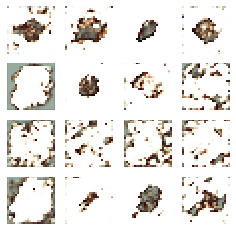

Epoch: 34, Test set ELBO: -794.43408203125, time elapse for current epoch 3.731747627258301


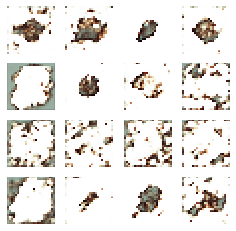

Epoch: 35, Test set ELBO: -790.9109497070312, time elapse for current epoch 3.729081869125366


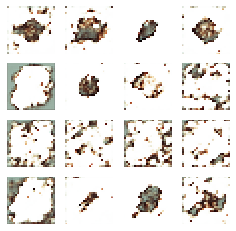

Epoch: 36, Test set ELBO: -786.7921142578125, time elapse for current epoch 3.7283122539520264


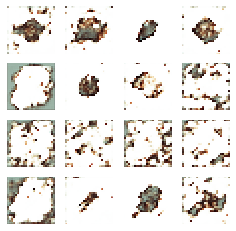

Epoch: 37, Test set ELBO: -782.9010009765625, time elapse for current epoch 3.7236032485961914


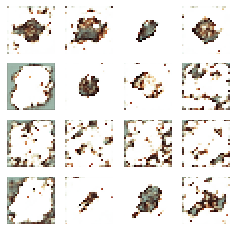

Epoch: 38, Test set ELBO: -780.2747802734375, time elapse for current epoch 3.7271852493286133


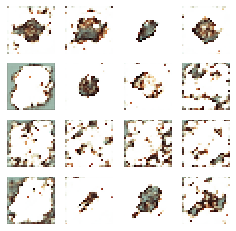

Epoch: 39, Test set ELBO: -776.3724365234375, time elapse for current epoch 3.7298474311828613


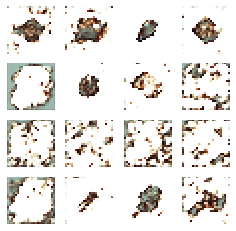

Epoch: 40, Test set ELBO: -773.8027954101562, time elapse for current epoch 3.737194776535034


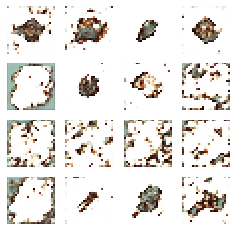

Epoch: 41, Test set ELBO: -770.626953125, time elapse for current epoch 3.7309839725494385


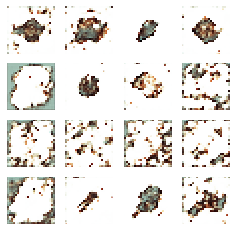

Epoch: 42, Test set ELBO: -767.546630859375, time elapse for current epoch 3.729356050491333


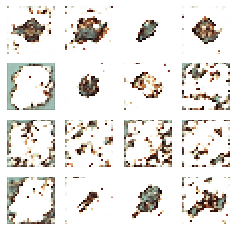

Epoch: 43, Test set ELBO: -764.976806640625, time elapse for current epoch 3.7280282974243164


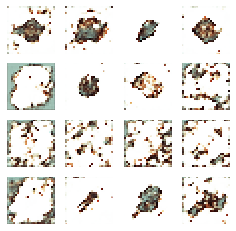

Epoch: 44, Test set ELBO: -761.3347778320312, time elapse for current epoch 3.7389657497406006


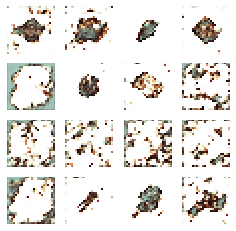

Epoch: 45, Test set ELBO: -759.762451171875, time elapse for current epoch 3.7277462482452393


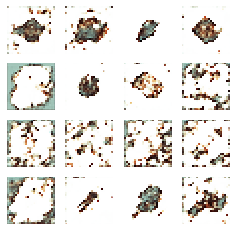

Epoch: 46, Test set ELBO: -756.12109375, time elapse for current epoch 3.7266783714294434


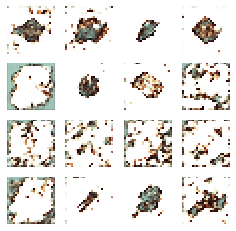

Epoch: 47, Test set ELBO: -754.35498046875, time elapse for current epoch 3.7302236557006836


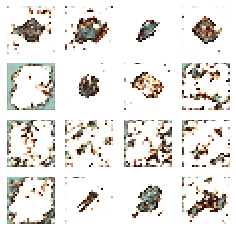

Epoch: 48, Test set ELBO: -751.4996948242188, time elapse for current epoch 3.72637677192688


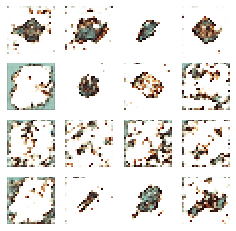

Epoch: 49, Test set ELBO: -748.73681640625, time elapse for current epoch 3.729402542114258


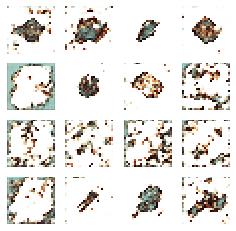

Epoch: 50, Test set ELBO: -746.0728759765625, time elapse for current epoch 3.7281687259674072


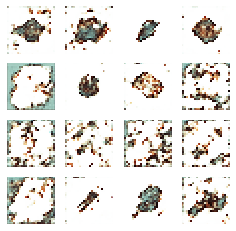

Epoch: 51, Test set ELBO: -743.587890625, time elapse for current epoch 3.7243716716766357


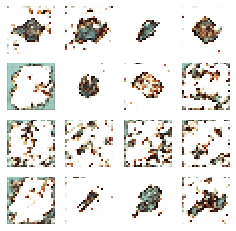

Epoch: 52, Test set ELBO: -743.0966796875, time elapse for current epoch 3.729210138320923


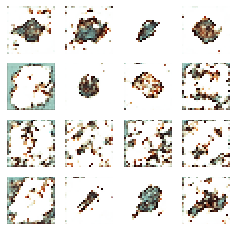

Epoch: 53, Test set ELBO: -740.9945068359375, time elapse for current epoch 3.727522134780884


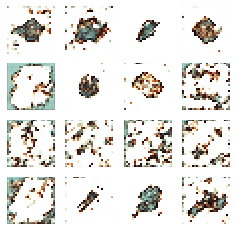

Epoch: 54, Test set ELBO: -737.5341186523438, time elapse for current epoch 3.7314774990081787


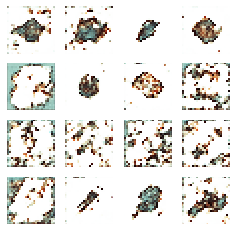

Epoch: 55, Test set ELBO: -737.5828857421875, time elapse for current epoch 3.725861072540283


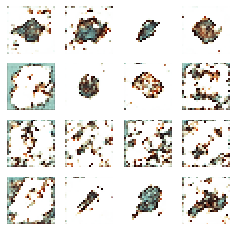

Epoch: 56, Test set ELBO: -734.7613525390625, time elapse for current epoch 3.7294743061065674


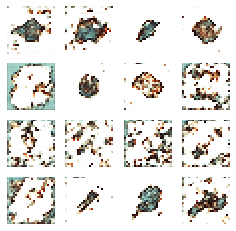

Epoch: 57, Test set ELBO: -733.3668212890625, time elapse for current epoch 3.7307887077331543


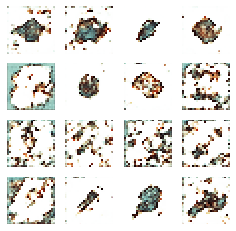

Epoch: 58, Test set ELBO: -730.9407958984375, time elapse for current epoch 3.7280828952789307


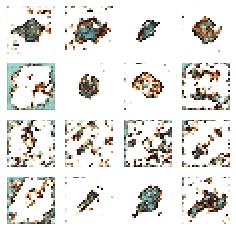

Epoch: 59, Test set ELBO: -729.1962890625, time elapse for current epoch 3.7231292724609375


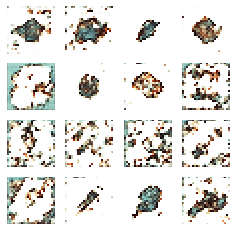

Epoch: 60, Test set ELBO: -728.3402709960938, time elapse for current epoch 3.723811388015747


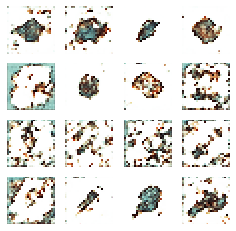

Epoch: 61, Test set ELBO: -726.4244384765625, time elapse for current epoch 3.728423833847046


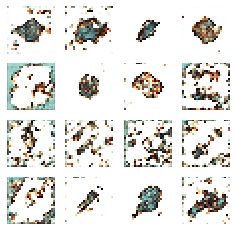

Epoch: 62, Test set ELBO: -725.218994140625, time elapse for current epoch 3.7385189533233643


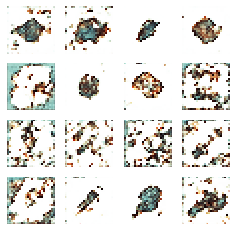

Epoch: 63, Test set ELBO: -722.7957763671875, time elapse for current epoch 3.72263765335083


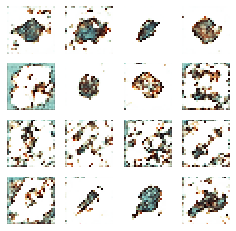

Epoch: 64, Test set ELBO: -721.73193359375, time elapse for current epoch 3.721717596054077


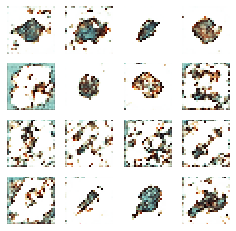

Epoch: 65, Test set ELBO: -720.8857421875, time elapse for current epoch 3.72927188873291


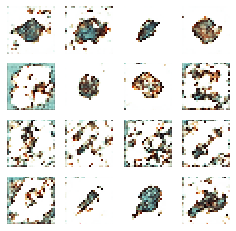

Epoch: 66, Test set ELBO: -720.4730224609375, time elapse for current epoch 3.7249341011047363


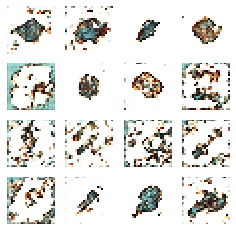

Epoch: 67, Test set ELBO: -718.696533203125, time elapse for current epoch 3.725210189819336


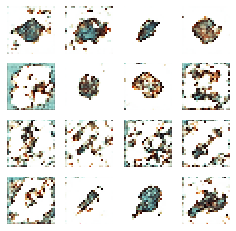

Epoch: 68, Test set ELBO: -717.761474609375, time elapse for current epoch 3.727815628051758


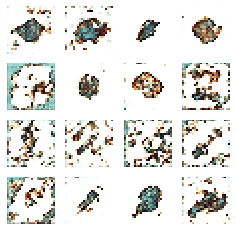

Epoch: 69, Test set ELBO: -716.7554321289062, time elapse for current epoch 3.7308642864227295


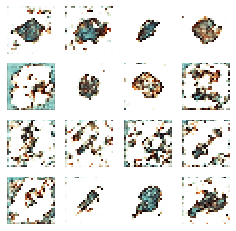

Epoch: 70, Test set ELBO: -714.942138671875, time elapse for current epoch 3.7332849502563477


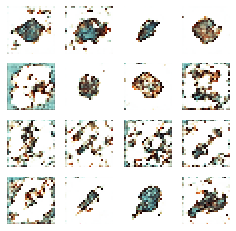

Epoch: 71, Test set ELBO: -714.5791015625, time elapse for current epoch 3.723468065261841


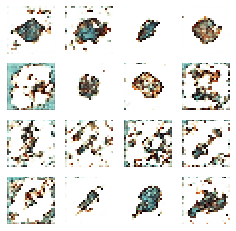

Epoch: 72, Test set ELBO: -714.062255859375, time elapse for current epoch 3.731110095977783


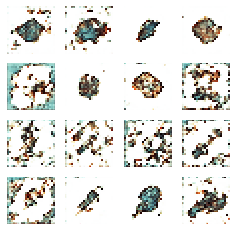

Epoch: 73, Test set ELBO: -712.262451171875, time elapse for current epoch 3.730344295501709


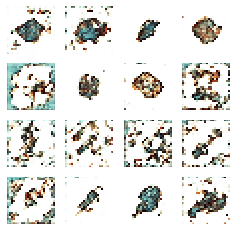

Epoch: 74, Test set ELBO: -711.6749267578125, time elapse for current epoch 3.7206075191497803


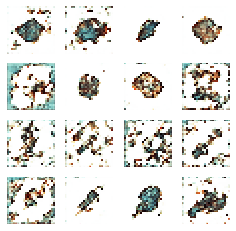

Epoch: 75, Test set ELBO: -711.3228759765625, time elapse for current epoch 3.7306365966796875


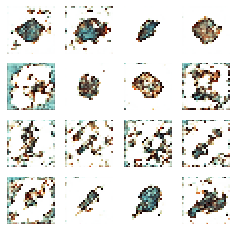

Epoch: 76, Test set ELBO: -709.6240844726562, time elapse for current epoch 3.7325103282928467


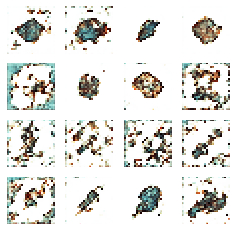

Epoch: 77, Test set ELBO: -709.4873657226562, time elapse for current epoch 3.7309679985046387


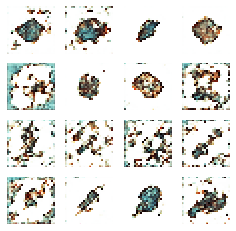

Epoch: 78, Test set ELBO: -708.794921875, time elapse for current epoch 3.721346139907837


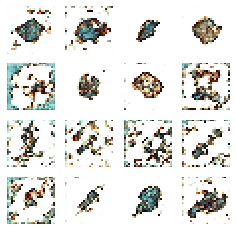

Epoch: 79, Test set ELBO: -707.5496215820312, time elapse for current epoch 3.732261896133423


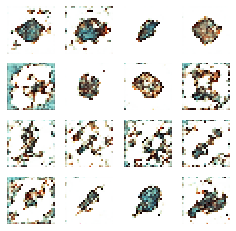

Epoch: 80, Test set ELBO: -707.93310546875, time elapse for current epoch 3.72503399848938


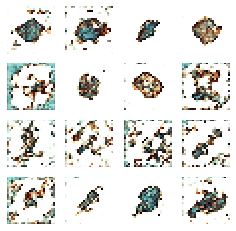

Epoch: 81, Test set ELBO: -706.919677734375, time elapse for current epoch 3.724647045135498


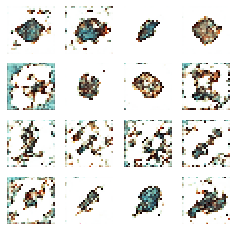

Epoch: 82, Test set ELBO: -705.072509765625, time elapse for current epoch 3.7315146923065186


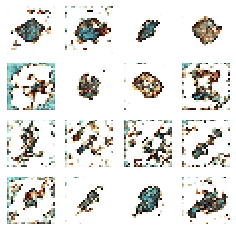

Epoch: 83, Test set ELBO: -704.3880615234375, time elapse for current epoch 3.732416868209839


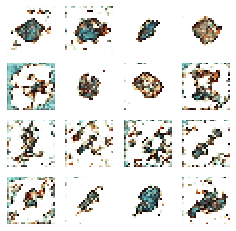

Epoch: 84, Test set ELBO: -703.804443359375, time elapse for current epoch 3.724494695663452


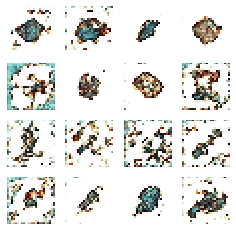

Epoch: 85, Test set ELBO: -703.6467895507812, time elapse for current epoch 3.729948043823242


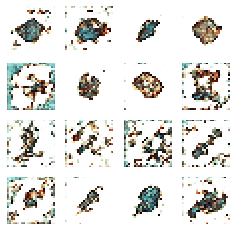

Epoch: 86, Test set ELBO: -702.6317138671875, time elapse for current epoch 3.728886365890503


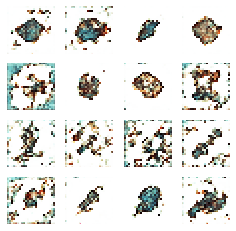

Epoch: 87, Test set ELBO: -702.4339599609375, time elapse for current epoch 3.7314367294311523


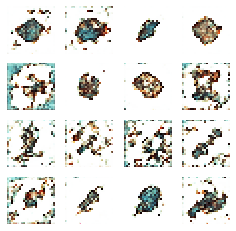

Epoch: 88, Test set ELBO: -701.7423095703125, time elapse for current epoch 3.7241761684417725


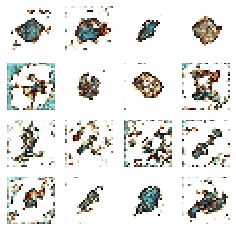

Epoch: 89, Test set ELBO: -701.0477905273438, time elapse for current epoch 3.720534086227417


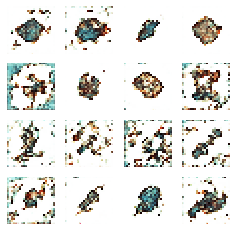

Epoch: 90, Test set ELBO: -700.5313720703125, time elapse for current epoch 3.7287425994873047


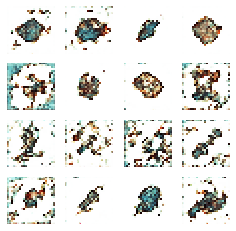

Epoch: 91, Test set ELBO: -700.48583984375, time elapse for current epoch 3.723046064376831


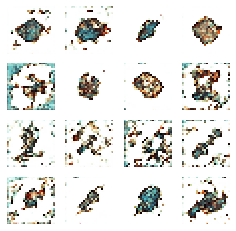

Epoch: 92, Test set ELBO: -699.14111328125, time elapse for current epoch 3.7285170555114746


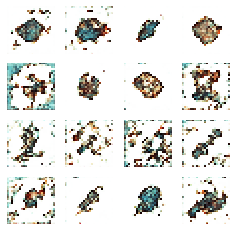

Epoch: 93, Test set ELBO: -698.87255859375, time elapse for current epoch 3.7277672290802


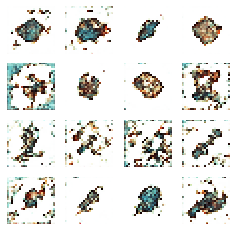

Epoch: 94, Test set ELBO: -698.203125, time elapse for current epoch 3.7222819328308105


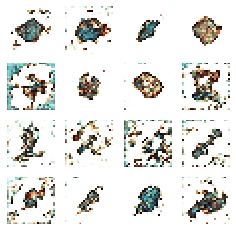

Epoch: 95, Test set ELBO: -697.9371948242188, time elapse for current epoch 3.724477529525757


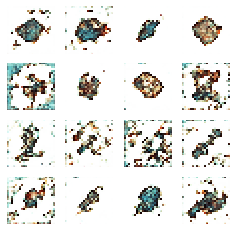

Epoch: 96, Test set ELBO: -697.8704833984375, time elapse for current epoch 3.7232892513275146


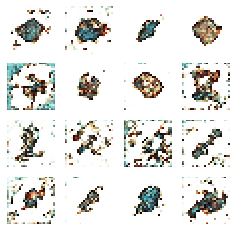

Epoch: 97, Test set ELBO: -696.80126953125, time elapse for current epoch 3.730053186416626


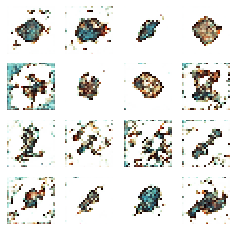

Epoch: 98, Test set ELBO: -696.297119140625, time elapse for current epoch 3.7259607315063477


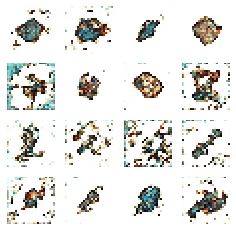

Epoch: 99, Test set ELBO: -696.02001953125, time elapse for current epoch 3.724421262741089


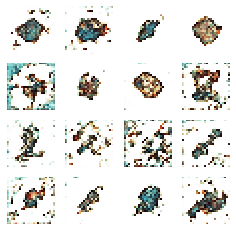

Epoch: 100, Test set ELBO: -695.8861083984375, time elapse for current epoch 3.727931499481201


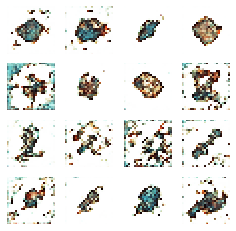

Epoch: 101, Test set ELBO: -694.9296264648438, time elapse for current epoch 3.731226682662964


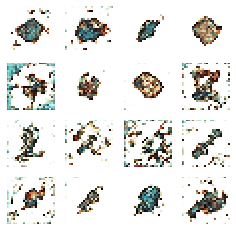

Epoch: 102, Test set ELBO: -695.2047119140625, time elapse for current epoch 3.721663236618042


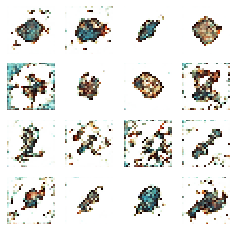

Epoch: 103, Test set ELBO: -694.4267578125, time elapse for current epoch 3.7212398052215576


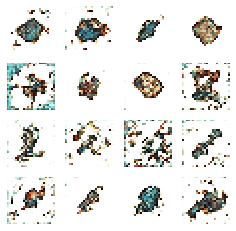

Epoch: 104, Test set ELBO: -694.0966796875, time elapse for current epoch 3.7291085720062256


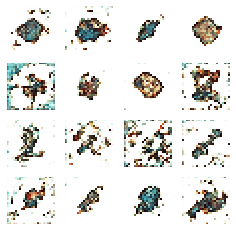

Epoch: 105, Test set ELBO: -693.3661499023438, time elapse for current epoch 3.728477716445923


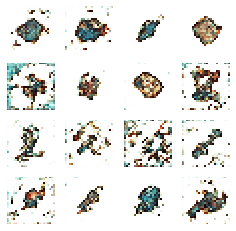

Epoch: 106, Test set ELBO: -692.929443359375, time elapse for current epoch 3.7260632514953613


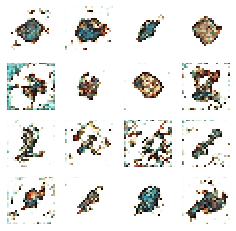

Epoch: 107, Test set ELBO: -692.34521484375, time elapse for current epoch 3.724097967147827


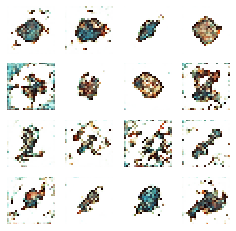

Epoch: 108, Test set ELBO: -691.685546875, time elapse for current epoch 3.7281196117401123


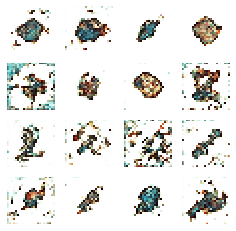

Epoch: 109, Test set ELBO: -691.591552734375, time elapse for current epoch 3.7260541915893555


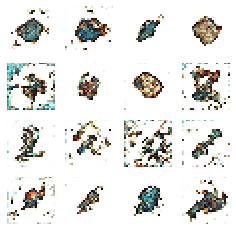

Epoch: 110, Test set ELBO: -691.1175537109375, time elapse for current epoch 3.726705312728882


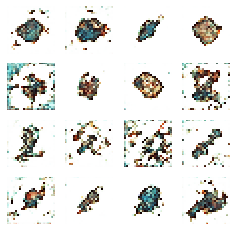

Epoch: 111, Test set ELBO: -691.3538818359375, time elapse for current epoch 3.726334571838379


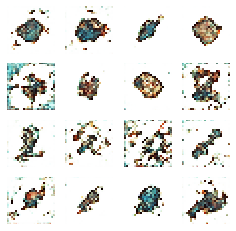

Epoch: 112, Test set ELBO: -690.3997802734375, time elapse for current epoch 3.7262439727783203


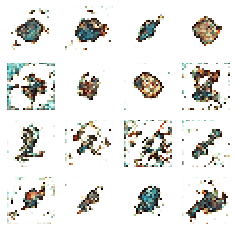

Epoch: 113, Test set ELBO: -689.8092041015625, time elapse for current epoch 3.724923849105835


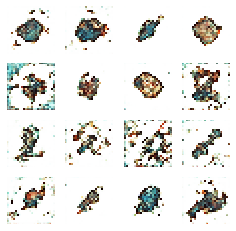

Epoch: 114, Test set ELBO: -690.4039306640625, time elapse for current epoch 3.719858407974243


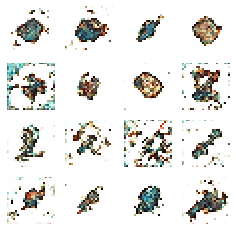

Epoch: 115, Test set ELBO: -689.16162109375, time elapse for current epoch 3.7227349281311035


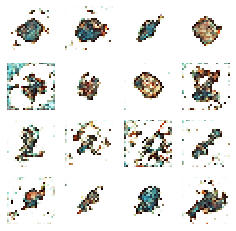

Epoch: 116, Test set ELBO: -689.6361083984375, time elapse for current epoch 3.724510908126831


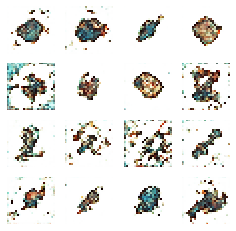

Epoch: 117, Test set ELBO: -688.5443115234375, time elapse for current epoch 3.7254064083099365


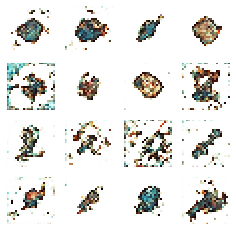

Epoch: 118, Test set ELBO: -688.1503295898438, time elapse for current epoch 3.720228910446167


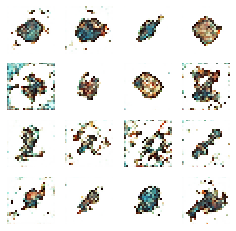

Epoch: 119, Test set ELBO: -688.27978515625, time elapse for current epoch 3.7282984256744385


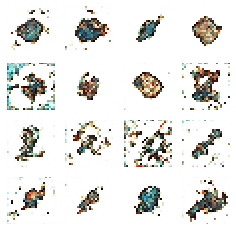

Epoch: 120, Test set ELBO: -687.5130004882812, time elapse for current epoch 3.7307851314544678


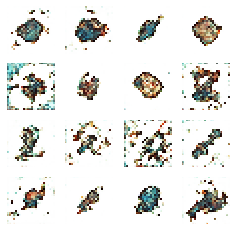

Epoch: 121, Test set ELBO: -687.6765747070312, time elapse for current epoch 3.731760263442993


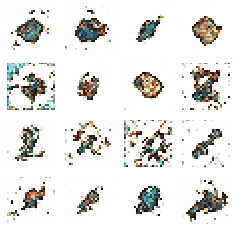

Epoch: 122, Test set ELBO: -686.627685546875, time elapse for current epoch 3.7243337631225586


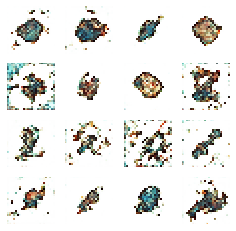

Epoch: 123, Test set ELBO: -686.5838623046875, time elapse for current epoch 3.7260725498199463


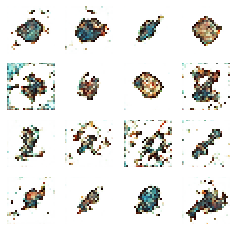

Epoch: 124, Test set ELBO: -686.0564575195312, time elapse for current epoch 3.722360372543335


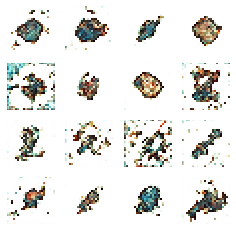

Epoch: 125, Test set ELBO: -686.2802734375, time elapse for current epoch 3.7204642295837402


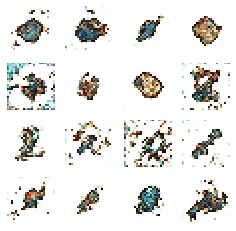

Epoch: 126, Test set ELBO: -685.189208984375, time elapse for current epoch 3.7253808975219727


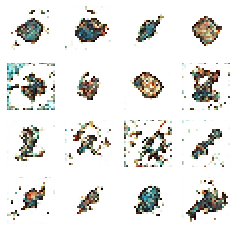

Epoch: 127, Test set ELBO: -685.5339965820312, time elapse for current epoch 3.7264046669006348


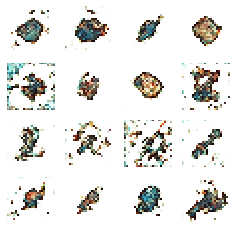

Epoch: 128, Test set ELBO: -684.9812622070312, time elapse for current epoch 3.7218987941741943


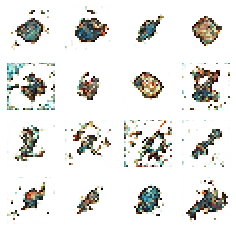

Epoch: 129, Test set ELBO: -685.1065673828125, time elapse for current epoch 3.726599931716919


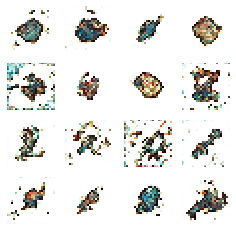

Epoch: 130, Test set ELBO: -684.41259765625, time elapse for current epoch 3.7243332862854004


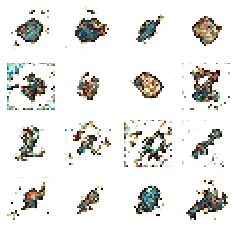

Epoch: 131, Test set ELBO: -684.3829956054688, time elapse for current epoch 3.7308461666107178


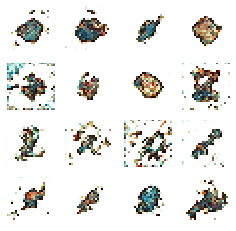

Epoch: 132, Test set ELBO: -684.1539916992188, time elapse for current epoch 3.7314302921295166


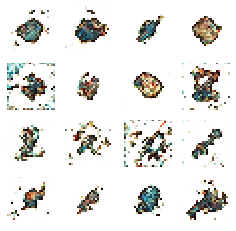

Epoch: 133, Test set ELBO: -683.71044921875, time elapse for current epoch 3.7285709381103516


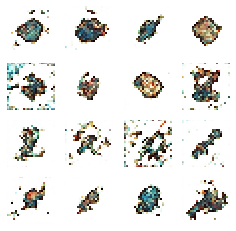

Epoch: 134, Test set ELBO: -683.8275146484375, time elapse for current epoch 3.7281699180603027


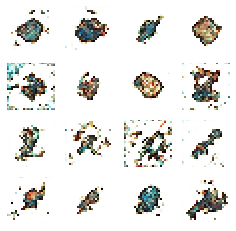

Epoch: 135, Test set ELBO: -683.5113525390625, time elapse for current epoch 3.7234373092651367


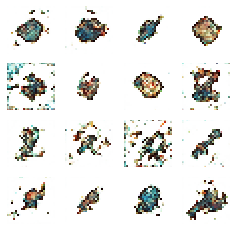

Epoch: 136, Test set ELBO: -682.7088623046875, time elapse for current epoch 3.7272725105285645


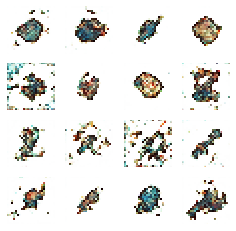

Epoch: 137, Test set ELBO: -682.2701416015625, time elapse for current epoch 3.7270476818084717


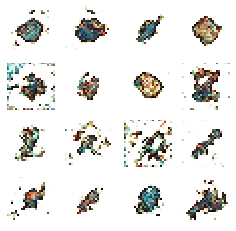

Epoch: 138, Test set ELBO: -681.9832763671875, time elapse for current epoch 3.728714942932129


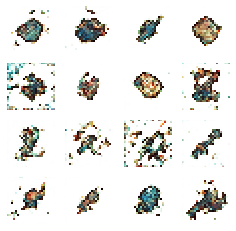

Epoch: 139, Test set ELBO: -681.96826171875, time elapse for current epoch 3.721693754196167


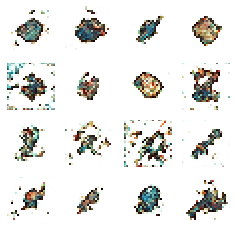

Epoch: 140, Test set ELBO: -681.958740234375, time elapse for current epoch 3.7246603965759277


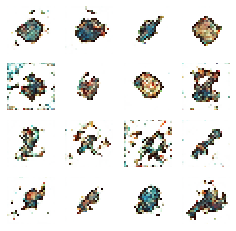

Epoch: 141, Test set ELBO: -680.7872924804688, time elapse for current epoch 3.7232933044433594


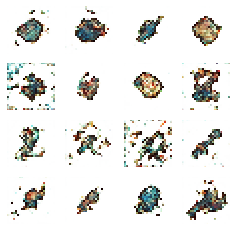

Epoch: 142, Test set ELBO: -681.5560302734375, time elapse for current epoch 3.7274394035339355


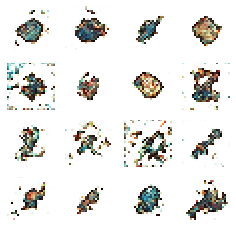

Epoch: 143, Test set ELBO: -680.842041015625, time elapse for current epoch 3.726834535598755


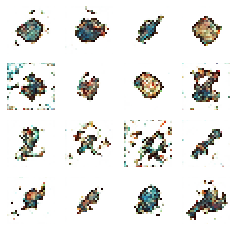

Epoch: 144, Test set ELBO: -681.0692138671875, time elapse for current epoch 3.722421169281006


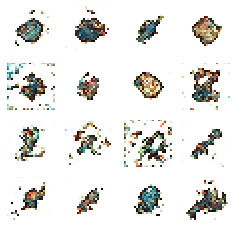

Epoch: 145, Test set ELBO: -680.6148681640625, time elapse for current epoch 3.7286598682403564


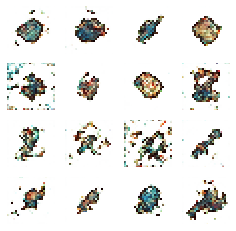

Epoch: 146, Test set ELBO: -680.5759887695312, time elapse for current epoch 3.7216455936431885


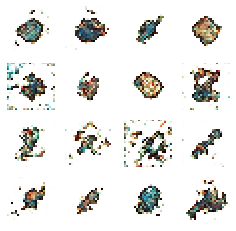

Epoch: 147, Test set ELBO: -680.241455078125, time elapse for current epoch 3.7308785915374756


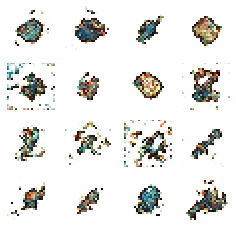

Epoch: 148, Test set ELBO: -680.1304931640625, time elapse for current epoch 3.723682165145874


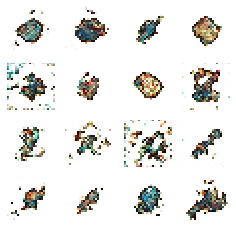

Epoch: 149, Test set ELBO: -679.756103515625, time elapse for current epoch 3.7299997806549072


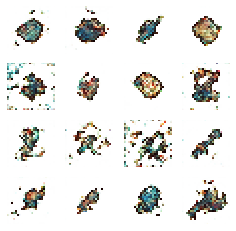

Epoch: 150, Test set ELBO: -679.81591796875, time elapse for current epoch 3.7241220474243164


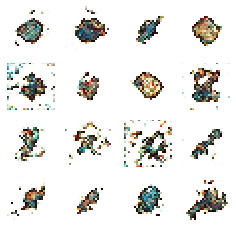

Epoch: 151, Test set ELBO: -679.5669555664062, time elapse for current epoch 3.7243642807006836


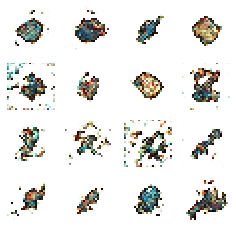

Epoch: 152, Test set ELBO: -678.6996459960938, time elapse for current epoch 3.7335364818573


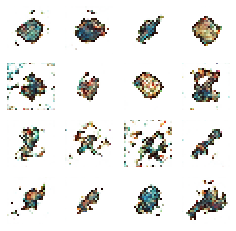

Epoch: 153, Test set ELBO: -678.427490234375, time elapse for current epoch 3.732666254043579


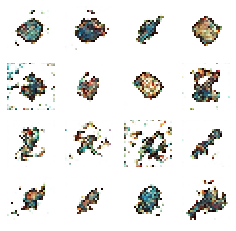

Epoch: 154, Test set ELBO: -678.4478759765625, time elapse for current epoch 3.724378824234009


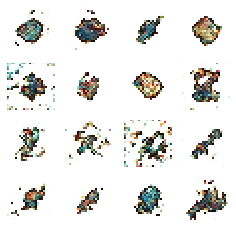

Epoch: 155, Test set ELBO: -677.8513793945312, time elapse for current epoch 3.7223141193389893


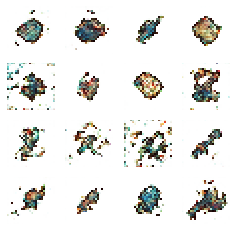

Epoch: 156, Test set ELBO: -677.6881713867188, time elapse for current epoch 3.722607374191284


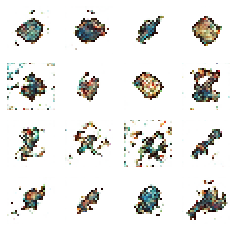

Epoch: 157, Test set ELBO: -677.8864135742188, time elapse for current epoch 3.723965644836426


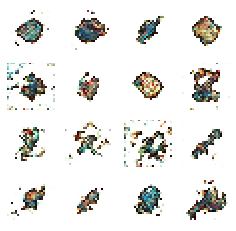

Epoch: 158, Test set ELBO: -677.4985961914062, time elapse for current epoch 3.7233848571777344


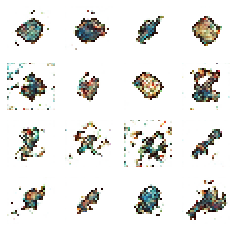

Epoch: 159, Test set ELBO: -677.3319091796875, time elapse for current epoch 3.725274085998535


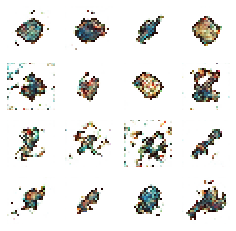

Epoch: 160, Test set ELBO: -677.3881225585938, time elapse for current epoch 3.7272229194641113


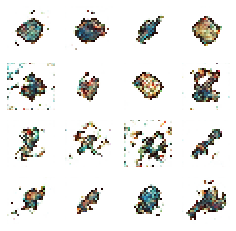

Epoch: 161, Test set ELBO: -676.8587646484375, time elapse for current epoch 3.7265396118164062


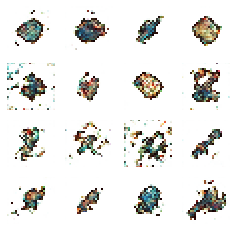

Epoch: 162, Test set ELBO: -676.846923828125, time elapse for current epoch 3.7314462661743164


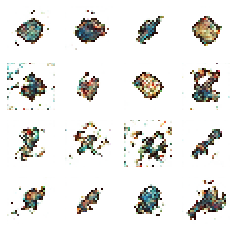

Epoch: 163, Test set ELBO: -676.7260131835938, time elapse for current epoch 3.726917266845703


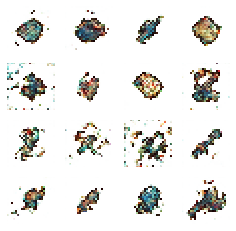

Epoch: 164, Test set ELBO: -676.3811645507812, time elapse for current epoch 3.7224719524383545


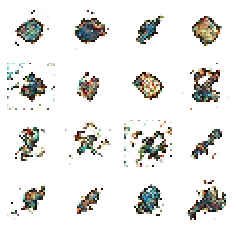

Epoch: 165, Test set ELBO: -676.2572021484375, time elapse for current epoch 3.7215752601623535


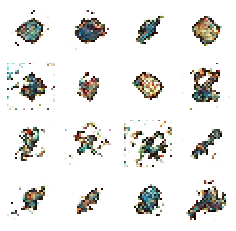

Epoch: 166, Test set ELBO: -675.9267578125, time elapse for current epoch 3.7215161323547363


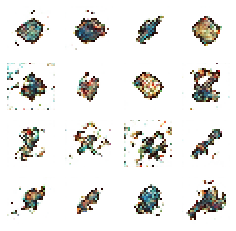

Epoch: 167, Test set ELBO: -676.422607421875, time elapse for current epoch 3.7348790168762207


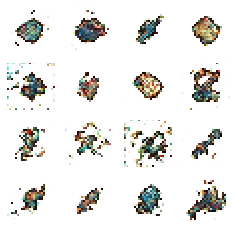

Epoch: 168, Test set ELBO: -675.584716796875, time elapse for current epoch 3.723757028579712


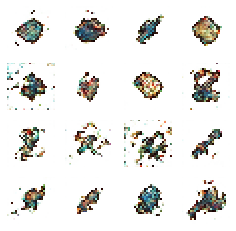

Epoch: 169, Test set ELBO: -675.3761596679688, time elapse for current epoch 3.7285892963409424


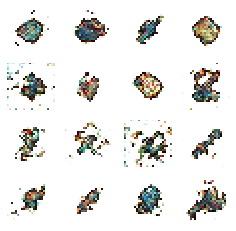

Epoch: 170, Test set ELBO: -674.9420166015625, time elapse for current epoch 3.7247555255889893


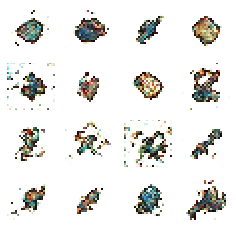

Epoch: 171, Test set ELBO: -674.7669677734375, time elapse for current epoch 3.7292232513427734


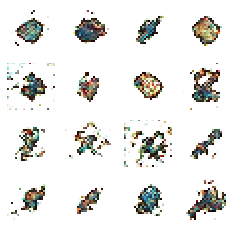

Epoch: 172, Test set ELBO: -674.987548828125, time elapse for current epoch 3.7244317531585693


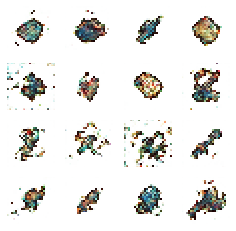

Epoch: 173, Test set ELBO: -674.6563720703125, time elapse for current epoch 3.7247586250305176


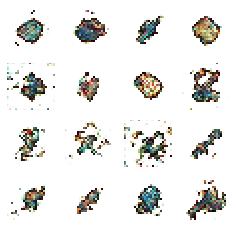

Epoch: 174, Test set ELBO: -674.634521484375, time elapse for current epoch 3.725687026977539


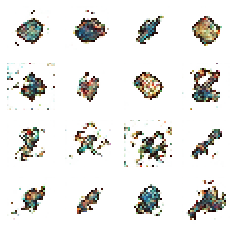

Epoch: 175, Test set ELBO: -674.0667114257812, time elapse for current epoch 3.731684684753418


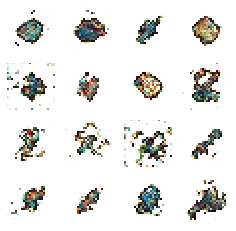

Epoch: 176, Test set ELBO: -673.7018432617188, time elapse for current epoch 3.7306554317474365


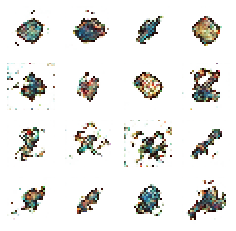

Epoch: 177, Test set ELBO: -673.6834106445312, time elapse for current epoch 3.723695993423462


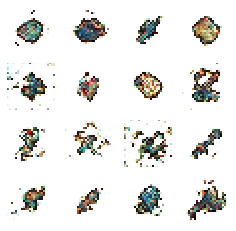

Epoch: 178, Test set ELBO: -673.8440551757812, time elapse for current epoch 3.7340378761291504


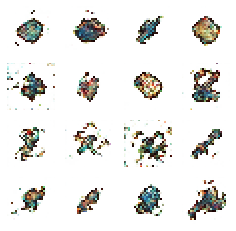

Epoch: 179, Test set ELBO: -672.9578857421875, time elapse for current epoch 3.727705717086792


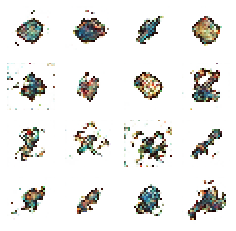

Epoch: 180, Test set ELBO: -673.2999267578125, time elapse for current epoch 3.721320867538452


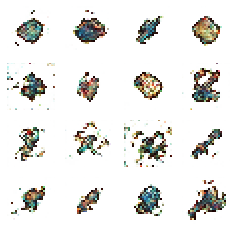

Epoch: 181, Test set ELBO: -672.8704833984375, time elapse for current epoch 3.7315292358398438


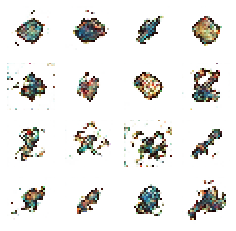

Epoch: 182, Test set ELBO: -672.9656982421875, time elapse for current epoch 3.727581739425659


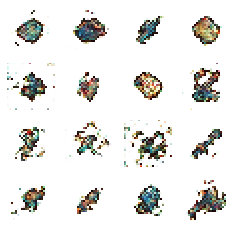

Epoch: 183, Test set ELBO: -673.1251831054688, time elapse for current epoch 3.718377113342285


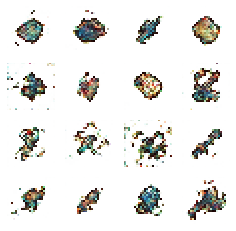

Epoch: 184, Test set ELBO: -672.3172607421875, time elapse for current epoch 3.725083589553833


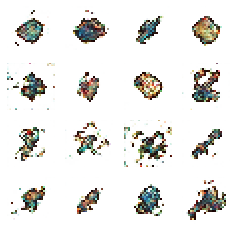

Epoch: 185, Test set ELBO: -672.5459594726562, time elapse for current epoch 3.729001045227051


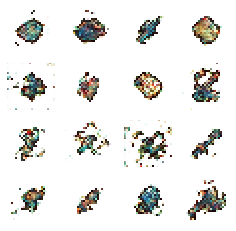

Epoch: 186, Test set ELBO: -672.297119140625, time elapse for current epoch 3.7236382961273193


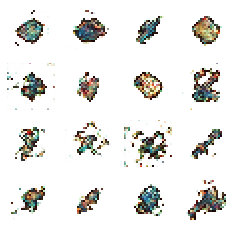

Epoch: 187, Test set ELBO: -672.1226806640625, time elapse for current epoch 3.7197911739349365


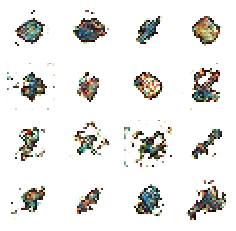

Epoch: 188, Test set ELBO: -671.4705810546875, time elapse for current epoch 3.721916437149048


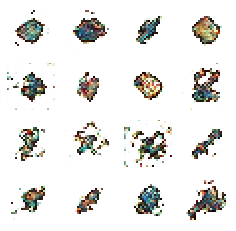

Epoch: 189, Test set ELBO: -671.9971313476562, time elapse for current epoch 3.733473300933838


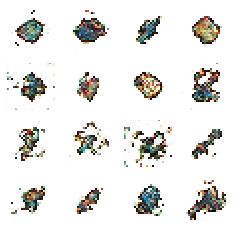

Epoch: 190, Test set ELBO: -671.5850219726562, time elapse for current epoch 3.7258412837982178


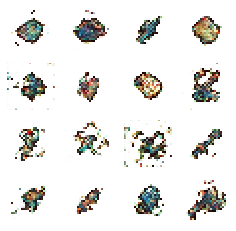

Epoch: 191, Test set ELBO: -671.4066162109375, time elapse for current epoch 3.717811346054077


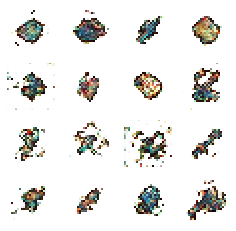

Epoch: 192, Test set ELBO: -671.178466796875, time elapse for current epoch 3.721534013748169


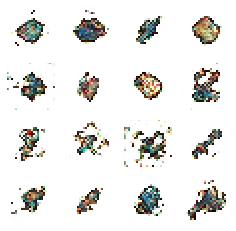

Epoch: 193, Test set ELBO: -670.995361328125, time elapse for current epoch 3.7258598804473877


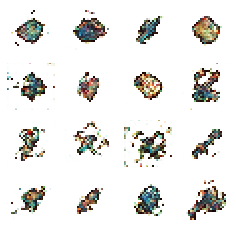

Epoch: 194, Test set ELBO: -670.8212890625, time elapse for current epoch 3.724447011947632


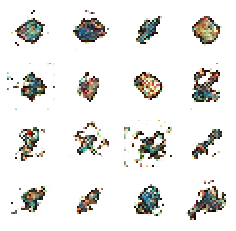

Epoch: 195, Test set ELBO: -670.5511474609375, time elapse for current epoch 3.7273294925689697


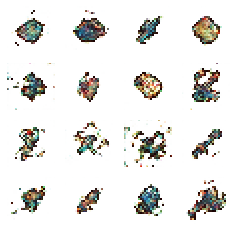

Epoch: 196, Test set ELBO: -671.0379028320312, time elapse for current epoch 3.727041244506836


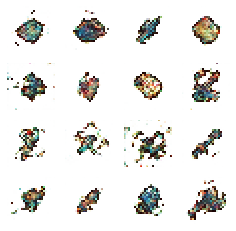

Epoch: 197, Test set ELBO: -670.8306274414062, time elapse for current epoch 3.7222001552581787


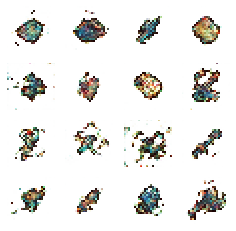

Epoch: 198, Test set ELBO: -670.0800170898438, time elapse for current epoch 3.7193362712860107


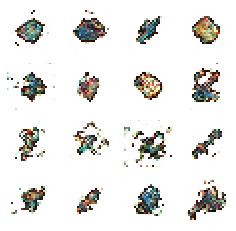

Epoch: 199, Test set ELBO: -670.0697631835938, time elapse for current epoch 3.729132652282715


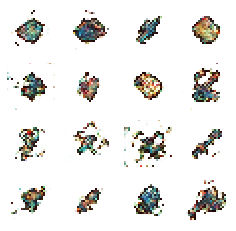

Epoch: 200, Test set ELBO: -669.825439453125, time elapse for current epoch 3.727177143096924


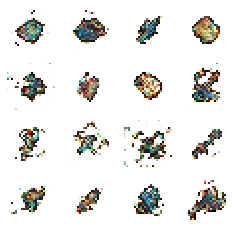

In [0]:
import time

generate_and_save_images(model, 0, random_vector_for_generation)

for epoch in range(1, epochs + 1):
  start_time = time.time()
  i = 0
  for train_x in train_ds:
    if i >= 128:
      break

    i += 1
    compute_apply_gradients(model, train_x, optimizer)
  end_time = time.time()

  if epoch % 1 == 0:
    loss = tf.keras.metrics.Mean()
    j = 0
    for test_x in train_ds:
      if j >= 4:
        break
      j += 1

      loss(compute_loss(model, test_x))
    elbo = -loss.result()
    print('Epoch: {}, Test set ELBO: {}, '
          'time elapse for current epoch {}'.format(epoch,
                                                    elbo,
                                                    end_time - start_time))
  
  generate_and_save_images(model, epoch, random_vector_for_generation)

In [0]:
import imageio
import glob
import PIL

anim_file = 'cvae.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  last = -1
  for i,filename in enumerate(filenames):
    frame = 2*(i**0.5)
    if round(frame) > round(last):
      last = frame
    else:
      continue
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

import IPython
if IPython.version_info >= (6,2,0,''):
  display.Image(filename=anim_file)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

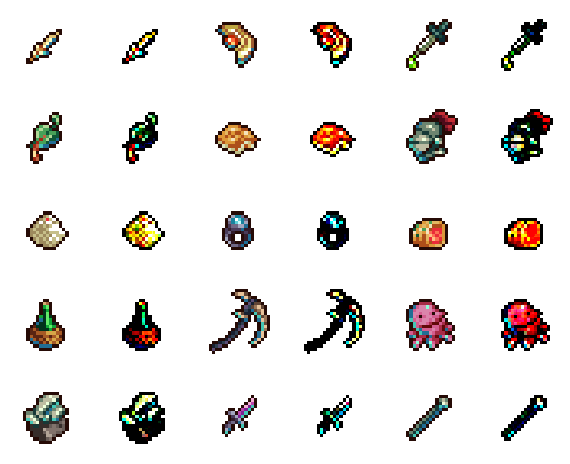

In [0]:
def show_comparison(original, reconstructed):
  plt.figure(figsize=(10,10))
  for n in range(0, 30, 2):
      ax = plt.subplot(6,6,n+1)
      plt.imshow(original[n])
      plt.axis('off')
      ax = plt.subplot(6,6,n+2)
      plt.imshow(reconstructed[n])
      plt.axis('off')

train = next(iter(train_ds))
mean, logvar = model.encode(train)
decoded = model.decode(mean)

show_comparison(train, decoded)

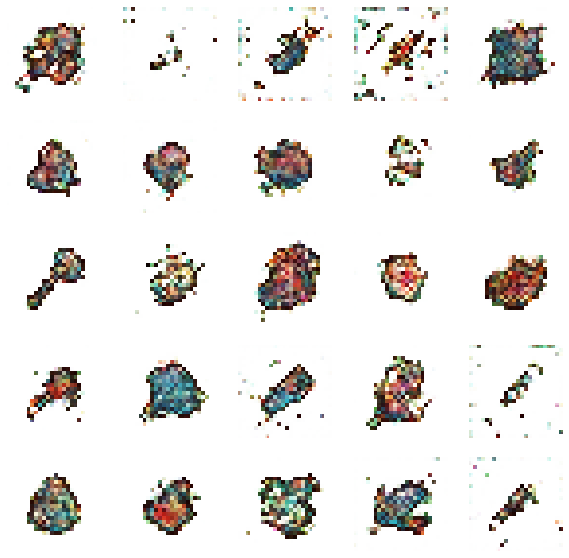

In [0]:
samples = model.sample()
show_batch(samples)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

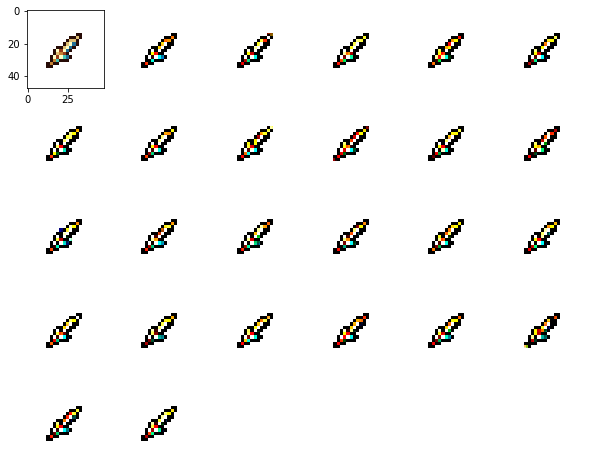

In [0]:
def show_variations(mean, var, original):
  plt.figure(figsize=(10,10))

  ax = plt.subplot(6,6,1)
  plt.imshow(original[0])

  for i in range(25):
      ax = plt.subplot(6,6,i+2)
      plt.imshow(model.decode(model.reparameterize(mean, var))[0])
      plt.axis('off')

show_variations(mean, logvar, train)

In [0]:
def interpolate(original, ind1=0, ind2=1):
  means, var = model.encode(original)
  print(means.shape)

  images = np.linspace(means[ind1], means[ind2], endpoint=True)
  print(images.shape)
  plt.figure(figsize=(16, 16))

  decoded_images = model.decode(images)

  for i in range(50):
    plt.subplot(5,10,i+1)
    plt.imshow(decoded_images[i])
    plt.axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

(128, 50)
(50, 50)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

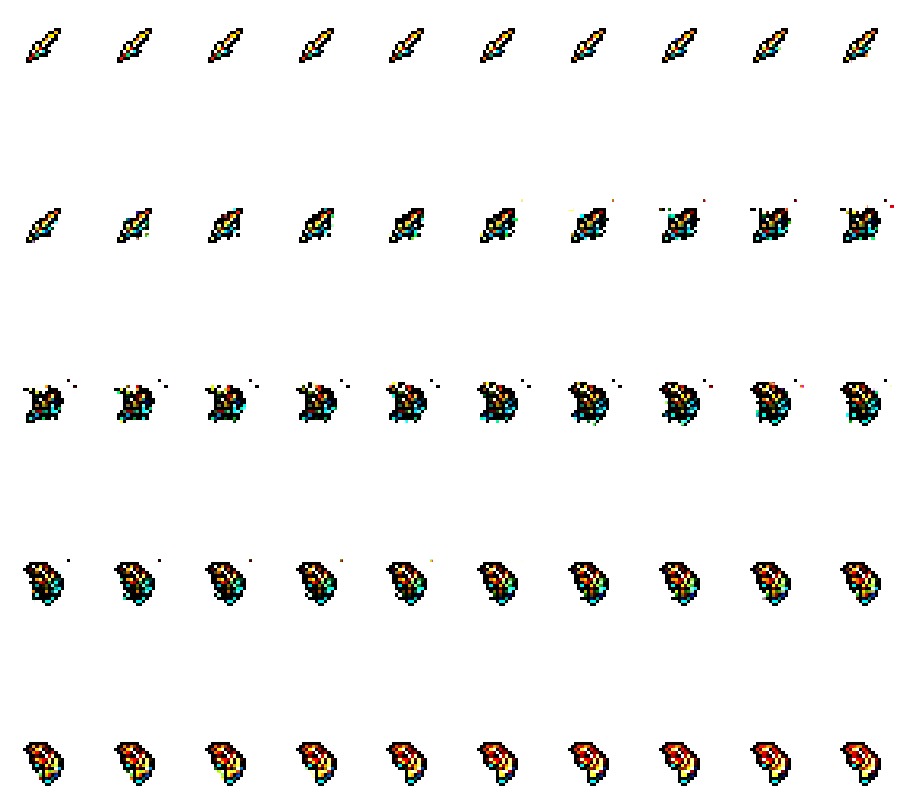

In [0]:
interpolate(train, 0, 2)